In [72]:

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import scipy.io as sio
from data.dataloader import DataLoader 


In [ ]:
# Tamaño objetivo para redimensionar las imágenes
obj_resize = (256, 256)

def load_img_and_keypoints_from_row(row):
    """
    Carga la imagen y sus keypoints a partir de una fila del dataframe.
    Se espera que row tenga las claves 'img' y 'mat' con las rutas a los archivos.
    """
    img_path = row['img']
    mat_path = row['mat']
    
    # Cargar la imagen
    img = Image.open(img_path)
    # Cargar el archivo .mat que contiene los keypoints
    mat_data = sio.loadmat(mat_path)
    kpts = np.array(mat_data['pts_coord'])  # Se espera shape (2, N)
    
    # Determinar el tamaño original de la imagen
    orig_size = img.size  # (ancho, alto)
    
    # Escalar los keypoints al nuevo tamaño
    kpts[0] = kpts[0] * obj_resize[0] / orig_size[0]
    kpts[1] = kpts[1] * obj_resize[1] / orig_size[1]
    
    # Redimensionar la imagen
    img_resized = img.resize(obj_resize, resample=Image.BILINEAR)
    
    return img_resized, kpts

def plot_image_with_keypoints(ax, img, kpts):
    """
    Dibuja la imagen junto con sus keypoints en el eje indicado.
    """
    ax.imshow(img)
    ax.scatter(kpts[0], kpts[1], c='w', edgecolors='k')
    ax.axis('off')

def plot_category_grid_for_exercise(category, num_images=8, dfs=None):
    """
    Visualiza en un grid las imágenes y keypoints para una categoría dada.
    Se seleccionan 'num_images' aleatorias del dataframe correspondiente.
    """
    # El DataLoader carga dataframes con llave: <categoria>_df
    key = f"{category}_df"
    df = dfs.get(key, None)
    if df is None or df.empty:
        print(f"No se encontró información para la categoría: {category}")
        return
    
    # Seleccionar num_images filas aleatorias (si hay menos, se toman todas)
    sample_rows = df.sample(num_images) if len(df) >= num_images else df
    ncols = 4
    nrows = (len(sample_rows) + ncols - 1) // ncols
    fig, axs = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
    axs = axs.flatten() if num_images > 1 else [axs]
    
    for i, (_, row) in enumerate(sample_rows.iterrows()):

        img, kpts = load_img_and_keypoints_from_row(row)
        plot_image_with_keypoints(axs[i], img, kpts)
        axs[i].set_title(f"{category.capitalize()} {i+1}")

    
    # Apagar ejes sobrantes
    for ax in axs[len(sample_rows):]:
        ax.axis("off")
    
    fig.suptitle(f"Visualización de {category.capitalize()} (8 imágenes)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()



In [75]:

dl = DataLoader()
dfs = dl.load_data()


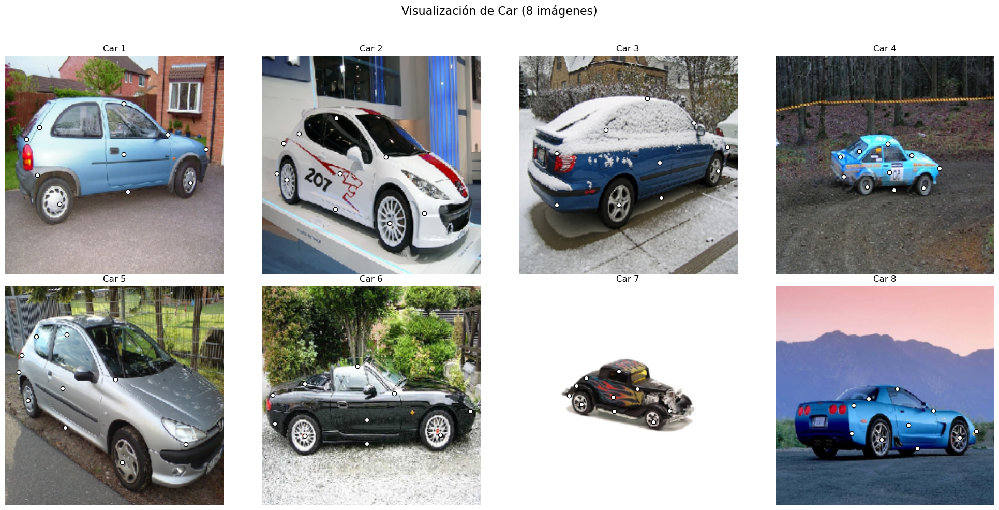

In [76]:
# Ejercicio 1: Visualizar 8 imágenes y keypoints de la categoría Car
plot_category_grid_for_exercise("car", num_images=8, dfs=dfs)

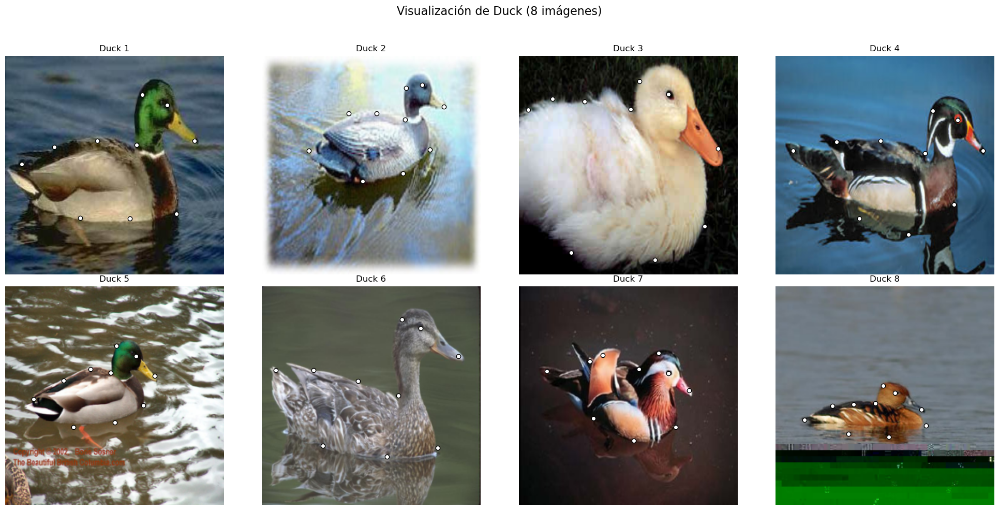

In [80]:
# Ejercicio 2: Visualizar 8 imágenes y keypoints de la categoría Duck
plot_category_grid_for_exercise("duck", num_images=8, dfs=dfs)

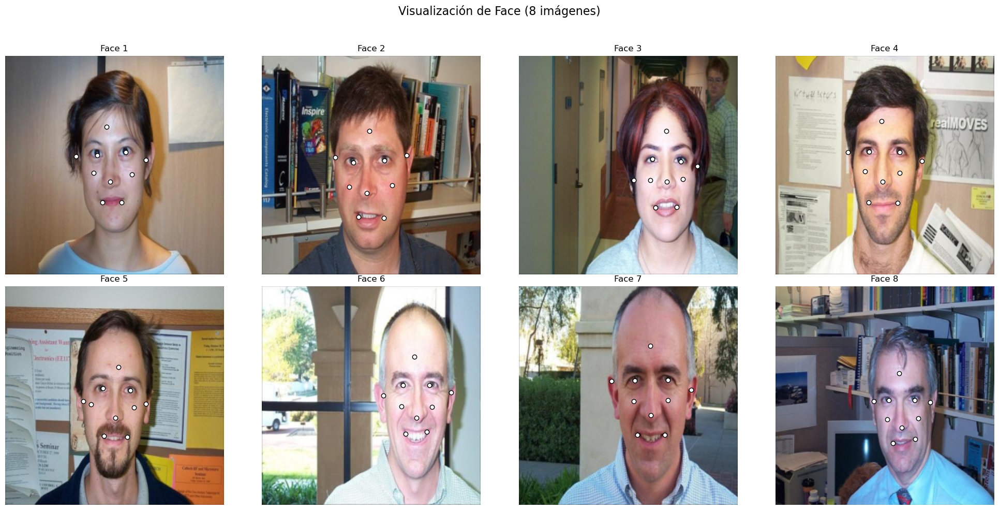

In [81]:
# Ejercicio 3: Visualizar 8 imágenes y keypoints de la categoría Face
plot_category_grid_for_exercise("face", num_images=8, dfs=dfs)

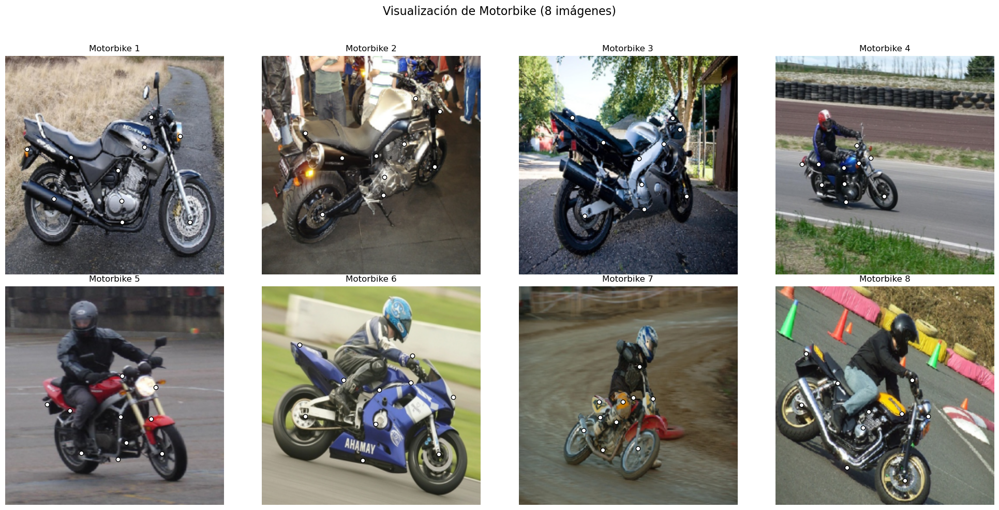

In [82]:
# Ejercicio 4: Visualizar 8 imágenes y keypoints de la categoría Motorbike
plot_category_grid_for_exercise("motorbike", num_images=8, dfs=dfs)

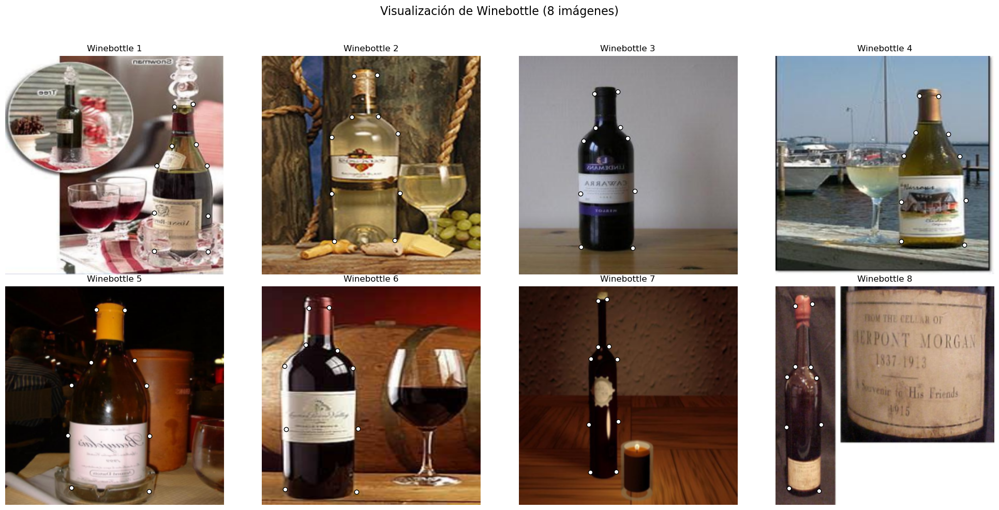

In [83]:
# Ejercicio 5: Visualizar 8 imágenes y keypoints de la categoría Winebottle
plot_category_grid_for_exercise("winebottle", num_images=8, dfs=dfs)